In [72]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
import pandas as pd
import numpy as np
import seaborn as sns # data visualization library  
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import balanced_accuracy_score,precision_score,recall_score,f1_score, roc_auc_score

In [73]:
df = pd.read_csv('../data/crawler/unified-events-statistics.csv')
df = df.drop(['golId','game','event11','event12','event13','event14','event15','event16','event17','event18','event19','event20','event21','event22','event23','event24','event25','event26','event27','event28','event29','event30','event31','event32','event33','event34','event35','event36','event37','event38','event39','event40','event41','event42','event43','event44','event45'],axis=1)
y = df.result
x = df.drop(['result'],axis=1)
df.columns

Index(['event1', 'event2', 'event3', 'event4', 'event5', 'event6', 'event7',
       'event8', 'event9', 'event10', 'blueTopGP', 'blueTopWR', 'blueTopKDA',
       'blueJungleGP', 'blueJungleWR', 'blueJungleKDA', 'blueMidGP',
       'blueMidWR', 'blueMidKDA', 'blueADCGP', 'blueADCWR', 'blueADCKDA',
       'blueSupportGP', 'blueSupportWR', 'blueSupportKDA', 'redTopGP',
       'redTopWR', 'redTopKDA', 'redJungleGP', 'redJungleWR', 'redJungleKDA',
       'redMidGP', 'redMidWR', 'redMidKDA', 'redAdcGP', 'redAdcWR',
       'redAdcKDA', 'redSupportGP', 'redSupportWR', 'redSupportKDA', 'result'],
      dtype='object')

In [74]:
#creating instance of one-hot-encoder
encoder = OneHotEncoder(handle_unknown='ignore')

#perform one-hot encoding on 'team' column 
encoder_df = pd.DataFrame(encoder.fit_transform(df[['event1', 'event2', 'event3','event4','event5','event6','event7','event8','event9','event10']]).toarray())
encoder_df.columns = encoder.get_feature_names()
#merge one-hot encoded columns back with original DataFrame
transformed_df = df.join(encoder_df)
transformed_df = transformed_df.drop(['event1', 'event2', 'event3','event4','event5','event6','event7','event8','event9','event10'],axis=1)
transformed_df.head()

,blueTopGP,blueTopWR,blueTopKDA,blueJungleGP,blueJungleWR,blueJungleKDA,blueMidGP,blueMidWR,blueMidKDA,blueADCGP,...,x9_RED: first_tower_mid,x9_RED: first_tower_top,x9_RED: herald,x9_RED: inhibitor_mid,x9_RED: second_tower_bot,x9_RED: second_tower_mid,x9_RED: second_tower_top,x9_RED: third_tower_bot,x9_RED: third_tower_mid,x9_RED: third_tower_top
0,1,1.00,2.0,1,1.0,2.3,1,1.00,2.7,6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,5,0.60,5.6,2,0.0,1.1,9,0.33,1.7,4,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,0,0.00,0.0,1,1.0,3.3,0,0.00,0.0,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,23,0.61,3.6,5,0.2,1.6,8,0.63,4.2,5,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,3,1.00,9.8,2,1.0,7.0,1,0.00,2.0,7,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [75]:
corr = transformed_df.corr()

transformed_df[transformed_df.columns[1:]].corr()['result'][:-1].sort_values(ascending=False)

result                      1.000000
x0_RED: first_blood         0.213946
x8_RED: dragon              0.167739
x3_RED: first_tower_bot     0.164071
x9_RED: dragon              0.157085
                              ...   
x8_BLUE: dragon            -0.148457
x3_BLUE: dragon            -0.150272
x3_BLUE: first_tower_bot   -0.150765
x9_BLUE: dragon            -0.157623
x0_BLUE: first_blood       -0.205024
Name: result, Length: 205, dtype: float64

<AxesSubplot:>

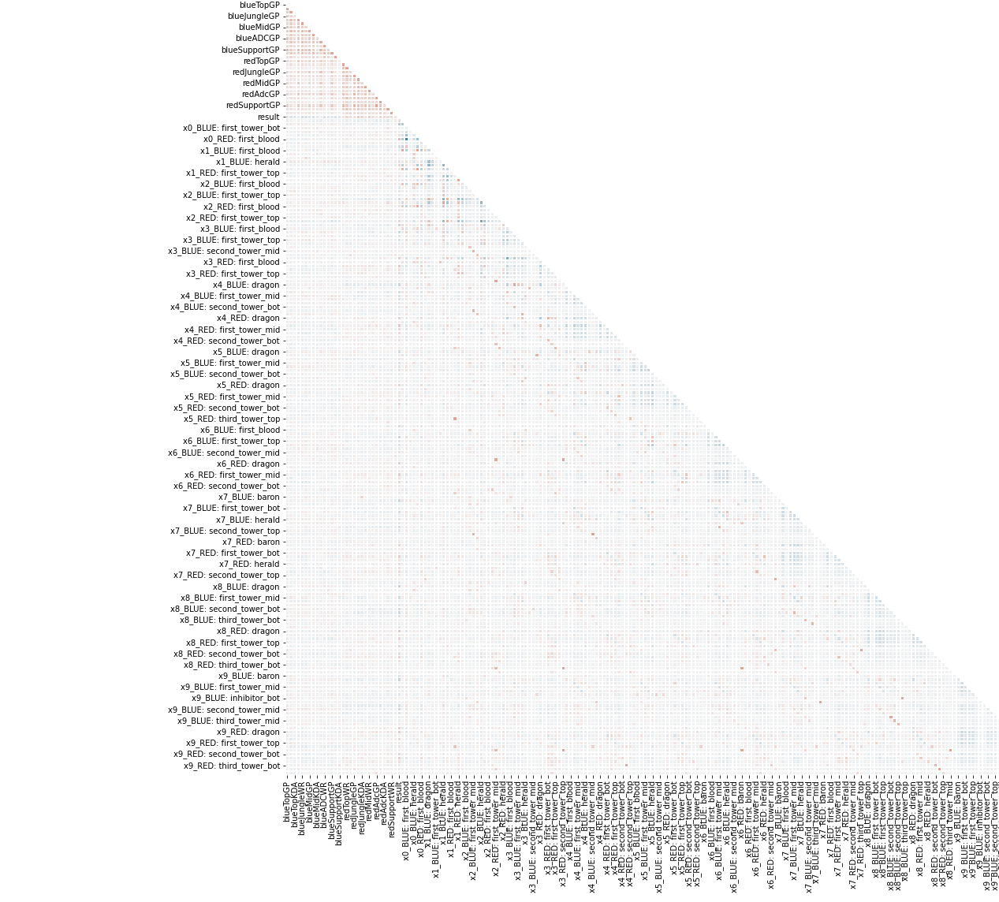

In [76]:
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(25, 18))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [77]:
y = transformed_df['result'].copy()
X = transformed_df.drop(['result'],axis=1)
X

,blueTopGP,blueTopWR,blueTopKDA,blueJungleGP,blueJungleWR,blueJungleKDA,blueMidGP,blueMidWR,blueMidKDA,blueADCGP,...,x9_RED: first_tower_mid,x9_RED: first_tower_top,x9_RED: herald,x9_RED: inhibitor_mid,x9_RED: second_tower_bot,x9_RED: second_tower_mid,x9_RED: second_tower_top,x9_RED: third_tower_bot,x9_RED: third_tower_mid,x9_RED: third_tower_top
0,1,1.00,2.0,1,1.00,2.3,1,1.00,2.7,6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,5,0.60,5.6,2,0.00,1.1,9,0.33,1.7,4,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,0,0.00,0.0,1,1.00,3.3,0,0.00,0.0,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,23,0.61,3.6,5,0.20,1.6,8,0.63,4.2,5,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,3,1.00,9.8,2,1.00,7.0,1,0.00,2.0,7,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4003,24,0.63,3.6,2,1.00,7.7,12,0.50,7.5,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4004,0,0.00,0.0,0,0.00,0.0,5,0.40,3.7,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4005,23,0.61,4.6,42,0.48,3.1,8,0.88,8.1,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4006,25,0.60,3.2,6,0.83,8.0,8,0.38,4.2,5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [78]:
def preprocess_input(X,y):
    X = X.copy()
    X_train,X_test,y_train,y_test = train_test_split(X,y,train_size=0.8,random_state=42, stratify=y)
    return X_train,X_test,y_train,y_test
X_train,X_test,y_train,y_test = preprocess_input(X,y)

In [79]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC, SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier

models = {
    'Logistic Regression': LogisticRegression(max_iter=10000),
    'Support Vector Machine (Linear Kernel)': LinearSVC(max_iter=100000),
    'Support Vector Machine (RBF Kernel)': SVC(max_iter=100000),
    'Decission Tree': DecisionTreeClassifier(),
    'Adaboost': AdaBoostClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Gradient Boosting Classifier': GradientBoostingClassifier()
}


for name, model in models.items():
  model.fit(X_train,y_train)
  print(name + ' trained')

Logistic Regression trained


C:\Users\linco\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\svm\_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Support Vector Machine (Linear Kernel) trained
Support Vector Machine (RBF Kernel) trained
Decission Tree trained
Adaboost trained
Random Forest trained
Gradient Boosting Classifier trained


In [80]:
scores_list = []

for name,model in models.items():    
    scores_list.append({
    'Model': name,
    'Balanced Accuracy': balanced_accuracy_score(y_test,model.predict(X_test)),
    'Precision':  precision_score(y_test,model.predict(X_test)),
    'Recall': recall_score(y_test,model.predict(X_test)),
    'F1-Score': f1_score(y_test,model.predict(X_test)),
    'ROC/AUC Score': roc_auc_score(y_test,model.predict(X_test))
    })
scores = pd.DataFrame(scores_list)

In [81]:
scores

,Model,Balanced Accuracy,Precision,Recall,F1-Score,ROC/AUC Score
0,Logistic Regression,0.791134,0.801609,0.762755,0.781699,0.791134
1,Support Vector Machine (Linear Kernel),0.784980,0.792553,0.760204,0.776042,0.784980
2,Support Vector Machine (RBF Kernel),0.626954,0.635838,0.561224,0.596206,0.626954
3,Decission Tree,0.645483,0.640625,0.627551,0.634021,0.645483
4,Adaboost,0.772673,0.774869,0.755102,0.764858,0.772673
5,Random Forest,0.749602,0.766667,0.704082,0.734043,0.749602
6,Gradient Boosting Classifier,0.766127,0.776280,0.734694,0.754915,0.766127
